In [1]:
%matplotlib inline

In [2]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [11, 10]

In [5]:
import pandas as pd
import numpy as np
import geopandas

df = geopandas.read_file("pudo_data.geojson")
df = df.to_crs(epsg=2249)
boston = geopandas.read_file("City_of_Boston_Boundary.geojson")
boston.crs = {'init' :'epsg:2249'}
neigh = geopandas.read_file("Boston_Neighborhoods.geojson")
bike_network = geopandas.read_file("Existing_Bike_Network.geojson")
df.head()

/opt/anaconda3/lib/python3.7/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


,id,periodAverageCount,refId,binPos,type,geometry
0,a0d53a79cf6ea00f13414a47bf629923{7:1,0.0450,a0d53a79cf6ea00f13414a47bf629923,1,pickup,POINT (772573.242 2952954.100)
1,a0d53a79cf6ea00f13414a47bf629923{7:2,0.0225,a0d53a79cf6ea00f13414a47bf629923,2,pickup,POINT (772603.081 2952965.584)
2,a0d53a79cf6ea00f13414a47bf629923{7:3,0.0205,a0d53a79cf6ea00f13414a47bf629923,3,pickup,POINT (772632.921 2952977.032)
3,a0d53a79cf6ea00f13414a47bf629923{7:4,0.0218,a0d53a79cf6ea00f13414a47bf629923,4,pickup,POINT (772662.733 2952988.517)
4,a0d53a79cf6ea00f13414a47bf629923{7:5,0.0437,a0d53a79cf6ea00f13414a47bf629923,5,pickup,POINT (772692.572 2952999.965)


In [21]:
df.loc[df['type']=='pickup'].id.count()/len(df)

108774

In [22]:
df.loc[df['type']=='dropoff'].id.count()

114446

In [23]:
df.loc[df['type']=='pickup'].periodAverageCount.sum()/df.periodAverageCount.sum()

0.39405915907363676

In [18]:
df.loc[df['type']=='dropoff'].periodAverageCount.sum()

4180.467299999999

In [6]:
bike_network = bike_network.loc[~pd.isna(bike_network.geometry)]
bike_network.head()

,FID,OBJECTID,STREET_NAM,ROADINVENT,FUNCTIONAL,JURISDICTI,Divided,InstallDat,ExisFacil,Shape__Length,geometry
0,1001,8325,Cambridge Street,6269000,3,2,1,2015,BFBL,405.776830,"LINESTRING (-71.12016 42.36049, -71.12046 42.3..."
1,1002,8326,American Legion Highway,6232400,5,2,1,2008,SLM,141.028948,"LINESTRING (-71.11649 42.28001, -71.11653 42.2..."
2,1003,2,Veterans Of Foreign Wars Parkway,4847800,2,3,1,2013,BL,111.516092,"LINESTRING (-71.16811 42.29049, -71.16777 42.2..."
3,1004,8327,American Legion Highway,6222900,5,2,1,2009,BFBL,183.328802,"LINESTRING (-71.11585 42.27721, -71.11584 42.2..."
4,1005,8328,Walk Hill Street,5133300,5,2,0,2015,BL,402.277052,"LINESTRING (-71.11114 42.29106, -71.11199 42.2..."


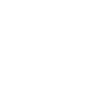

In [7]:
bike_network.geometry[2000]

In [8]:
import folium
from folium import plugins
import matplotlib.cm as cm

m = folium.Map([42.34, -71.062], tiles = "Stamen Toner", zoom_start=11)

#N = len(bike_network)
N = 1500
for k in range(N):
    folium.Choropleth(bike_network.geometry[k],line_color="green", line_weight=2.5, opacity=1).add_to(m)
m

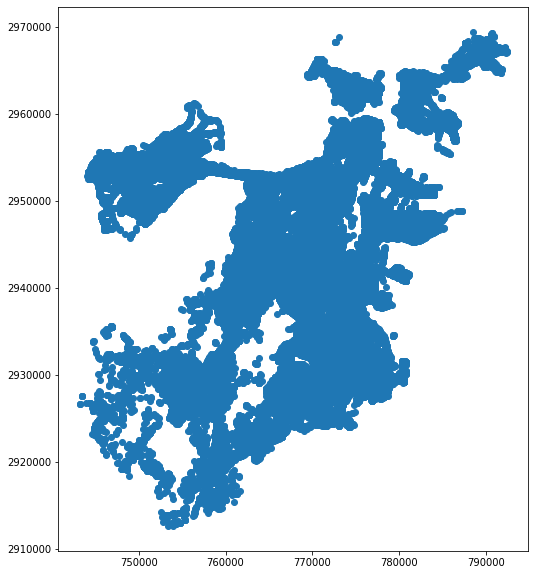

In [9]:
pudo = geopandas.sjoin(df,boston, op = 'within')
pudo.plot()

In [10]:
pudo = pudo.to_crs(epsg=4326)
pudo['lat'] = pudo.geometry.y
pudo['lon'] = pudo.geometry.x

In [11]:
pudo.head()

,id,periodAverageCount,refId,binPos,type,geometry,index_right,OBJECTID,BOSTON_LAN,CITY,COUNTY,SHAPESTArea,SHAPESTLength,lat,lon
0,a0d53a79cf6ea00f13414a47bf629923{7:1,0.0450,a0d53a79cf6ea00f13414a47bf629923,1,pickup,POINT (-71.06937 42.35025),0,1,1,,,1.346516e+09,816364.595339,42.350251,-71.069365
1,a0d53a79cf6ea00f13414a47bf629923{7:2,0.0225,a0d53a79cf6ea00f13414a47bf629923,2,pickup,POINT (-71.06925 42.35028),0,1,1,,,1.346516e+09,816364.595339,42.350282,-71.069255
2,a0d53a79cf6ea00f13414a47bf629923{7:3,0.0205,a0d53a79cf6ea00f13414a47bf629923,3,pickup,POINT (-71.06914 42.35031),0,1,1,,,1.346516e+09,816364.595339,42.350313,-71.069144
3,a0d53a79cf6ea00f13414a47bf629923{7:4,0.0218,a0d53a79cf6ea00f13414a47bf629923,4,pickup,POINT (-71.06903 42.35034),0,1,1,,,1.346516e+09,816364.595339,42.350344,-71.069034
4,a0d53a79cf6ea00f13414a47bf629923{7:5,0.0437,a0d53a79cf6ea00f13414a47bf629923,5,pickup,POINT (-71.06892 42.35037),0,1,1,,,1.346516e+09,816364.595339,42.350375,-71.068923


In [58]:
pudo.loc[pudo['type']=='dropoff'].periodAverageCount.count()/len(pudo)

0.5138629115601403

In [65]:
pudo.loc[pudo['type']=='dropoff'].periodAverageCount.median()/pudo.loc[pudo['type']=='pickup'].periodAverageCount.median()


1.0566037735849056

Estimated number of clusters: 30
Estimated number of noise points: 75300


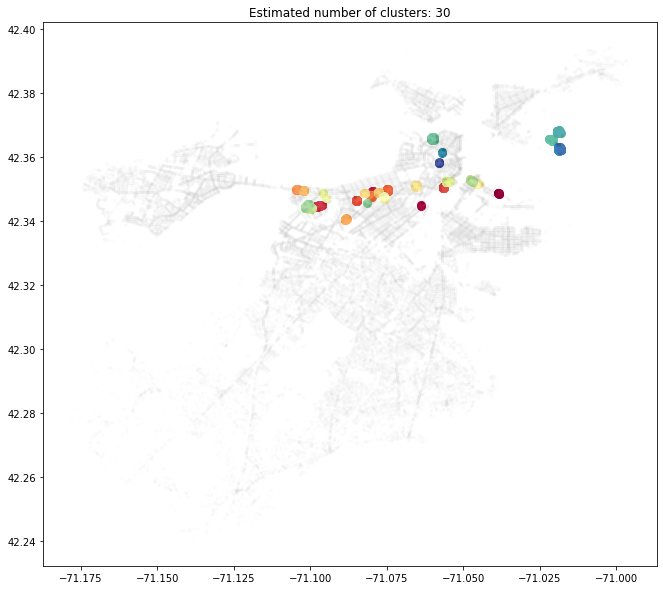

In [25]:
import matplotlib.pyplot as plt

from sklearn.cluster import DBSCAN
from sklearn import metrics

X = pudo.loc[pudo['type']=='pickup'][['lon','lat']].to_numpy()
weights = pudo.loc[pudo['type']=='pickup']['periodAverageCount'].to_numpy()

db = DBSCAN(eps=0.0005, min_samples=4).fit(X, sample_weight=weights)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)


# Plot
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=8)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=2, alpha = 0.005)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

#plt.savefig('clusters_pickup.png')

In [26]:
cores = pd.DataFrame(X[core_samples_mask], columns=['lon','lat'])
cores['label'] = labels[core_samples_mask]
cores['density'] = weights[core_samples_mask]
cores.head()

,lon,lat,label,density
0,-71.038328,42.348482,0,0.0179
1,-71.038381,42.348412,0,0.0271
2,-71.063713,42.344719,1,0.2189
3,-71.063681,42.344800,1,0.2017
4,-71.079744,42.349395,2,0.2698


In [27]:
cores.groupby('label').density.sum()

label
0      0.5086
1      0.4206
2      0.9345
3     12.2666
4      2.8571
5      3.1396
6      5.0548
7      4.1436
8      2.9577
9      4.7989
10     3.0330
11     3.9279
12     3.7686
13     3.6773
14     5.8169
15     7.1638
16     0.5298
17     0.4418
18     3.6963
19     7.8475
20     6.1637
21     8.1804
22     0.1991
23     6.9582
24    51.7726
25    46.3637
26     0.3605
27    21.6013
28    10.3024
29     1.2130
Name: density, dtype: float64

In [28]:
import folium
from folium import plugins
import matplotlib.cm as cm

m = folium.Map([42.34, -71.062], tiles = "Stamen Toner", zoom_start=11)
m.add_child(plugins.HeatMap(pudo.loc[pudo['type']=='pickup'][['lat','lon','periodAverageCount']], \
                            radius=15, min_opacity=0))

cluster=plugins.MarkerCluster()
lats=cores.lat
lons=cores.lon
labels=cores.label
densities=cores.density
for k in range(len(cores)):
    location = lats[k], lons[k]
    label = labels[k]
    density = densities[k]
    marker = folium.Marker(location=location)
    popup = 'cluster:{}<br>density:{}<br>lon:{}<br>lat:{}'.format(label,density,location[1], location[0])
    folium.Popup(popup).add_to(marker)
    cluster.add_child(marker)

m.add_child(cluster)
#m.save("pudo_clusters_pickup_v1.html")

In [29]:

pudo.to_csv("pudo_all.csv")

In [31]:
neigh.crs = {'init' :'epsg:2249'}
neigh

/opt/anaconda3/lib/python3.7/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


,OBJECTID,Name,Acres,Neighborhood_ID,SqMiles,ShapeSTArea,ShapeSTLength,geometry
0,27,Roslindale,1605.568237,15,2.51,6.993827e+07,53563.912597,"MULTIPOLYGON (((757409.123 2924367.749, 757360..."
1,28,Jamaica Plain,2519.245394,11,3.94,1.097379e+08,56349.937161,"POLYGON ((762983.826 2944104.016, 762974.500 2..."
2,29,Mission Hill,350.853564,13,0.55,1.528312e+07,17918.724113,"POLYGON ((766903.580 2947645.876, 766885.597 2..."
3,30,Longwood,188.611947,28,0.29,8.215904e+06,11908.757148,"POLYGON ((764826.911 2947985.998, 764767.962 2..."
4,31,Bay Village,26.539839,33,0.04,1.156071e+06,4650.635493,"POLYGON ((773315.750 2952419.751, 773315.819 2..."
5,32,Leather District,15.639908,27,0.02,6.812717e+05,3237.140537,"POLYGON ((775544.125 2952813.250, 775554.364 2..."
6,33,Chinatown,76.324410,26,0.12,3.324678e+06,9736.590413,"POLYGON ((775667.139 2953742.283, 775612.337 2..."
7,34,North End,126.910439,14,0.20,5.527506e+06,16177.826815,"POLYGON ((777233.200 2959748.000, 777179.300 2..."
8,35,Roxbury,2108.469072,16,3.29,9.184455e+07,49488.800485,"POLYGON ((765347.826 2932136.987, 765382.856 2..."
9,36,South End,471.535356,32,0.74,2.054000e+07,17912.333569,"POLYGON ((772855.065 2952041.273, 772640.224 2..."


In [30]:
neigh.Name.unique()

array(['Roslindale', 'Jamaica Plain', 'Mission Hill', 'Longwood',
       'Bay Village', 'Leather District', 'Chinatown', 'North End',
       'Roxbury', 'South End', 'Back Bay', 'East Boston', 'Charlestown',
       'West End', 'Beacon Hill', 'Downtown', 'Fenway', 'Brighton',
       'West Roxbury', 'Hyde Park', 'Mattapan', 'Dorchester',
       'South Boston Waterfront', 'South Boston', 'Allston',
       'Harbor Islands'], dtype=object)

In [190]:
dorch = geopandas.sjoin(df,neigh.loc[neigh.Name=='Dorchester'], op = 'within')
dorch = dorch.to_crs(epsg=4326)
dorch['lat'] = dorch.geometry.y
dorch['lon'] = dorch.geometry.x
dorch.head()

,id,periodAverageCount,refId,binPos,type,geometry,index_right,OBJECTID,Name,Acres,Neighborhood_ID,SqMiles,ShapeSTArea,ShapeSTLength,lat,lon
77,5541eab56119ddac22f7bc1727830bd8{15:5,0.0073,5541eab56119ddac22f7bc1727830bd8,5,pickup,POINT (-71.06791 42.30394),21,48,Dorchester,4662.879457,6,7.29,2.031142e+08,104344.034005,42.303936,-71.067910
78,5541eab56119ddac22f7bc1727830bd8{15:6,0.0106,5541eab56119ddac22f7bc1727830bd8,6,pickup,POINT (-71.06780 42.30396),21,48,Dorchester,4662.879457,6,7.29,2.031142e+08,104344.034005,42.303964,-71.067799
79,5541eab56119ddac22f7bc1727830bd8{15:7,0.0040,5541eab56119ddac22f7bc1727830bd8,7,pickup,POINT (-71.06769 42.30399),21,48,Dorchester,4662.879457,6,7.29,2.031142e+08,104344.034005,42.303992,-71.067687
80,5541eab56119ddac22f7bc1727830bd8{15:9,0.0086,5541eab56119ddac22f7bc1727830bd8,9,pickup,POINT (-71.06746 42.30405),21,48,Dorchester,4662.879457,6,7.29,2.031142e+08,104344.034005,42.304048,-71.067463
81,5541eab56119ddac22f7bc1727830bd8{15:11,0.0046,5541eab56119ddac22f7bc1727830bd8,11,pickup,POINT (-71.06724 42.30410),21,48,Dorchester,4662.879457,6,7.29,2.031142e+08,104344.034005,42.304104,-71.067239


Estimated number of clusters: 5
Estimated number of noise points: 11753


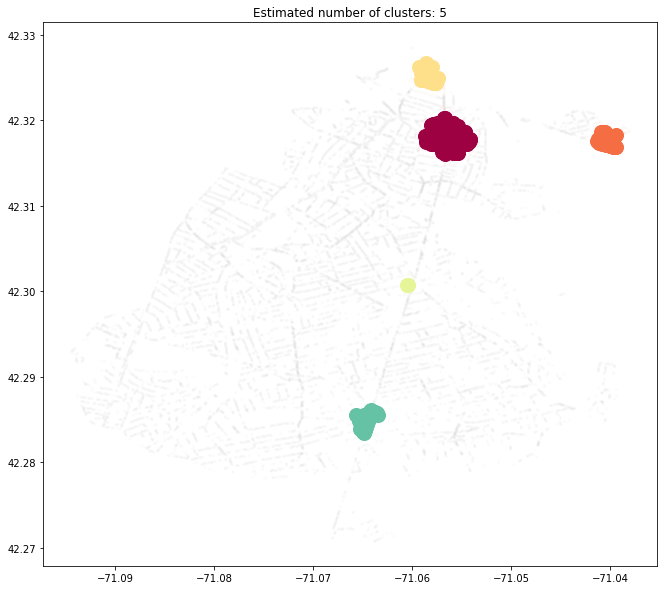

In [191]:
X = dorch.loc[dorch['type']=='pickup'][['lon','lat']].to_numpy()
weights = dorch.loc[dorch['type']=='pickup']['periodAverageCount'].to_numpy()

db = DBSCAN(eps=0.0015, min_samples=2).fit(X, sample_weight=weights)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)


# Plot
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=2, alpha = 0.01)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

#plt.savefig('clusters_pickup.png')

In [192]:
cores = pd.DataFrame(X[core_samples_mask], columns=['lon','lat'])
cores['label'] = labels[core_samples_mask]
cores['density'] = weights[core_samples_mask]
cores.groupby('label').density.sum()

label
0    4.4722
1    2.4024
2    1.4262
3    0.0139
4    2.8747
Name: density, dtype: float64

In [193]:
midpoints = pd.DataFrame()
for k in range(cores.label.nunique()):
    midpoints = midpoints.append(cores.iloc[np.sqrt((cores['lat']-cores.groupby('label').lat.mean()[k])**2 \
                   + (cores['lon']-cores.groupby('label').lon.mean()[k])**2)
                .abs().argsort()[:1]])

midpoints

,lon,lat,label,density
391,-71.056686,42.318200,0,0.0278
211,-71.040087,42.317668,1,0.0099
285,-71.058616,42.325247,2,0.0364
32,-71.060558,42.300745,3,0.0079
363,-71.064572,42.284907,4,0.1177


In [194]:
output = pd.DataFrame(cores.groupby('label').density.sum().reset_index())
output = output.merge(midpoints[['label','lat','lon']], on='label')
output['clusters'] = cores.label.value_counts().sort_index()
output['spread'] = 100*output.density/output.clusters
output['neighborhood'] = 'Dorchester'
output.head()

,label,density,lat,lon,clusters,spread,neighborhood
0,0,4.4722,42.318200,-71.056686,226,1.978850,Dorchester
1,1,2.4024,42.317668,-71.040087,67,3.585672,Dorchester
2,2,1.4262,42.325247,-71.058616,62,2.300323,Dorchester
3,3,0.0139,42.300745,-71.060558,2,0.695000,Dorchester
4,4,2.8747,42.284907,-71.064572,79,3.638861,Dorchester


In [195]:
total_output = output
output.to_csv('dorch_pickup_clusters.csv')

In [196]:
m = folium.Map([42.34, -71.062], tiles = "Stamen Toner", zoom_start=11)
m.add_child(plugins.HeatMap(dorch.loc[dorch['type']=='pickup'][['lat','lon','periodAverageCount']], \
                            radius=75, min_opacity=0))

cluster=plugins.MarkerCluster()
lats=cores.lat
lons=cores.lon
labels=cores.label
densities=cores.density
for k in range(len(cores)):
    location = lats[k], lons[k]
    label = labels[k]
    density = densities[k]
    marker = folium.Marker(location=location)
    popup = 'cluster:{}<br>density:{}<br>lon:{}<br>lat:{}'.format(label,density,location[1], location[0])
    folium.Popup(popup).add_to(marker)
    cluster.add_child(marker)

m.add_child(cluster)

locations = output[['lat', 'lon']]
locationlist = locations.values.tolist()
for point in range(len(locationlist)):
    folium.Marker(locationlist[point],icon = folium.Icon(color='red')).add_to(m)
m
#m.save("pudo_clusters_pickup_v1.html")

In [197]:
allbright = geopandas.sjoin(df,neigh.loc[(neigh.Name=='Allston')|(neigh.Name=='Brighton')], op = 'within')
allbright = allbright.to_crs(epsg=4326)
allbright['lat'] = allbright.geometry.y
allbright['lon'] = allbright.geometry.x
allbright.head()

,id,periodAverageCount,refId,binPos,type,geometry,index_right,OBJECTID,Name,Acres,Neighborhood_ID,SqMiles,ShapeSTArea,ShapeSTLength,lat,lon
32622,76ccbb264f5ba00ef8150bfb0b461b6d{341:17,0.0040,76ccbb264f5ba00ef8150bfb0b461b6d,17,pickup,POINT (-71.11709 42.35351),24,51,Allston,998.534479,24,1.56,4.349599e+07,37859.091242,42.353512,-71.117093
32623,76ccbb264f5ba00ef8150bfb0b461b6d{341:19,0.0066,76ccbb264f5ba00ef8150bfb0b461b6d,19,pickup,POINT (-71.11690 42.35341),24,51,Allston,998.534479,24,1.56,4.349599e+07,37859.091242,42.353406,-71.116898
32624,76ccbb264f5ba00ef8150bfb0b461b6d{341:32,0.0053,76ccbb264f5ba00ef8150bfb0b461b6d,32,pickup,POINT (-71.11561 42.35273),24,51,Allston,998.534479,24,1.56,4.349599e+07,37859.091242,42.352732,-71.115611
32625,76ccbb264f5ba00ef8150bfb0b461b6d{341:33,0.0079,76ccbb264f5ba00ef8150bfb0b461b6d,33,pickup,POINT (-71.11551 42.35268),24,51,Allston,998.534479,24,1.56,4.349599e+07,37859.091242,42.352680,-71.115512
32626,76ccbb264f5ba00ef8150bfb0b461b6d{341:34,0.0040,76ccbb264f5ba00ef8150bfb0b461b6d,34,pickup,POINT (-71.11541 42.35263),24,51,Allston,998.534479,24,1.56,4.349599e+07,37859.091242,42.352628,-71.115413


Estimated number of clusters: 6
Estimated number of noise points: 10343


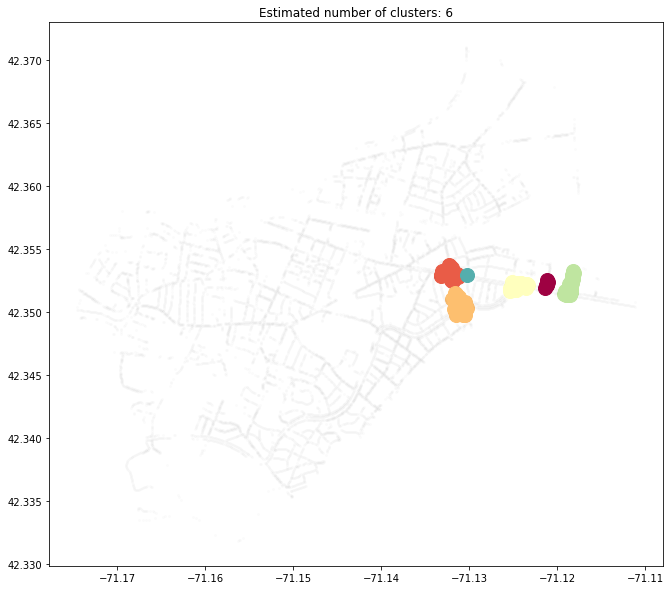

In [198]:
X = allbright.loc[allbright['type']=='pickup'][['lon','lat']].to_numpy()
weights = allbright.loc[allbright['type']=='pickup']['periodAverageCount'].to_numpy()

db = DBSCAN(eps=0.0008, min_samples=3).fit(X, sample_weight=weights)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)


# Plot
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=2, alpha = 0.01)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

#plt.savefig('clusters_pickup.png')

In [199]:
cores = pd.DataFrame(X[core_samples_mask], columns=['lon','lat'])
cores['label'] = labels[core_samples_mask]
cores['density'] = weights[core_samples_mask]
cores.groupby('label').density.sum()

label
0    0.5953
1    4.2244
2    5.8558
3    3.4903
4    5.6881
5    0.0112
Name: density, dtype: float64

In [200]:
midpoints = pd.DataFrame()
for k in range(cores.label.nunique()):
    midpoints = midpoints.append(cores.iloc[np.sqrt((cores['lat']-cores.groupby('label').lat.mean()[k])**2 \
                   + (cores['lon']-cores.groupby('label').lon.mean()[k])**2)
                .abs().argsort()[:1]])

midpoints

,lon,lat,label,density
7,-71.121224,42.352250,0,0.0562
194,-71.132158,42.353113,1,0.0218
36,-71.131134,42.350517,2,0.0985
215,-71.124418,42.352022,3,0.0655
84,-71.118568,42.352179,4,0.0271
143,-71.130202,42.352956,5,0.0112


In [201]:
output = pd.DataFrame(cores.groupby('label').density.sum().reset_index())
output = output.merge(midpoints[['label','lat','lon']], on='label')
output['clusters'] = cores.label.value_counts().sort_index()
output['spread'] = 100*output.density/output.clusters
output['neighborhood'] = 'Allston/Brighton'
output.head()

,label,density,lat,lon,clusters,spread,neighborhood
0,0,0.5953,42.352250,-71.121224,11,5.411818,Allston/Brighton
1,1,4.2244,42.353113,-71.132158,61,6.925246,Allston/Brighton
2,2,5.8558,42.350517,-71.131134,89,6.579551,Allston/Brighton
3,3,3.4903,42.352022,-71.124418,47,7.426170,Allston/Brighton
4,4,5.6881,42.352179,-71.118568,47,12.102340,Allston/Brighton


In [202]:
total_output = total_output.append(output)
output.to_csv('allbright_pickup_clusters.csv')

In [203]:
m = folium.Map([42.34, -71.062], tiles = "Stamen Toner", zoom_start=11)
m.add_child(plugins.HeatMap(allbright.loc[allbright['type']=='pickup'][['lat','lon','periodAverageCount']], \
                            radius=50, min_opacity=0))

cluster=plugins.MarkerCluster()
lats=cores.lat
lons=cores.lon
labels=cores.label
densities=cores.density
for k in range(len(cores)):
    location = lats[k], lons[k]
    label = labels[k]
    density = densities[k]
    marker = folium.Marker(location=location)
    popup = 'cluster:{}<br>density:{}<br>lon:{}<br>lat:{}'.format(label,density,location[1], location[0])
    folium.Popup(popup).add_to(marker)
    cluster.add_child(marker)

m.add_child(cluster)

locations = output[['lat', 'lon']]
locationlist = locations.values.tolist()
for point in range(len(locationlist)):
    folium.Marker(locationlist[point],icon = folium.Icon(color='red')).add_to(m)
m
#m.save("pudo_clusters_pickup_v1.html")

In [204]:
jp = geopandas.sjoin(df,neigh.loc[neigh.Name.isin(['Jamaica Plain','Roxbury'])], 
                     op = 'within')
jp = jp.to_crs(epsg=4326)
jp['lat'] = jp.geometry.y
jp['lon'] = jp.geometry.x
jp.head()

,id,periodAverageCount,refId,binPos,type,geometry,index_right,OBJECTID,Name,Acres,Neighborhood_ID,SqMiles,ShapeSTArea,ShapeSTLength,lat,lon
40,ed5607cf570b692aace7b2d18af309ab{7:5,0.0053,ed5607cf570b692aace7b2d18af309ab,5,pickup,POINT (-71.09953 42.32530),1,28,Jamaica Plain,2519.245394,11,3.94,1.097379e+08,56349.937161,42.325304,-71.099526
41,ed5607cf570b692aace7b2d18af309ab{7:6,0.0053,ed5607cf570b692aace7b2d18af309ab,6,pickup,POINT (-71.09959 42.32537),1,28,Jamaica Plain,2519.245394,11,3.94,1.097379e+08,56349.937161,42.325370,-71.099591
42,ed5607cf570b692aace7b2d18af309ab{7:5,0.0073,ed5607cf570b692aace7b2d18af309ab,5,dropoff,POINT (-71.09951 42.32535),1,28,Jamaica Plain,2519.245394,11,3.94,1.097379e+08,56349.937161,42.325353,-71.099511
43,ed5607cf570b692aace7b2d18af309ab{7:6,0.0099,ed5607cf570b692aace7b2d18af309ab,6,dropoff,POINT (-71.09958 42.32542),1,28,Jamaica Plain,2519.245394,11,3.94,1.097379e+08,56349.937161,42.325419,-71.099576
44,3b22518488aa486e1970727c30270bc7{7:6,0.0046,3b22518488aa486e1970727c30270bc7,6,pickup,POINT (-71.09933 42.32506),1,28,Jamaica Plain,2519.245394,11,3.94,1.097379e+08,56349.937161,42.325059,-71.099335


Estimated number of clusters: 3
Estimated number of noise points: 9802


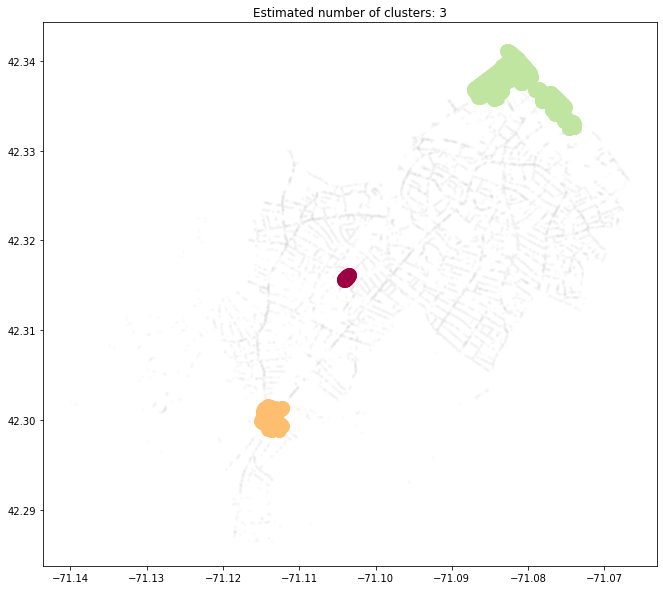

In [205]:
X = jp.loc[jp['type']=='pickup'][['lon','lat']].to_numpy()
weights = jp.loc[jp['type']=='pickup']['periodAverageCount'].to_numpy()

db = DBSCAN(eps=0.0015, min_samples=2).fit(X, sample_weight=weights)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)


# Plot
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=2, alpha = 0.01)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

#plt.savefig('clusters_pickup.png')

In [206]:
cores = pd.DataFrame(X[core_samples_mask], columns=['lon','lat'])
cores['label'] = labels[core_samples_mask]
cores['density'] = weights[core_samples_mask]
cores.groupby('label').density.sum()

label
0     0.1356
1     5.4091
2    15.9814
Name: density, dtype: float64

In [207]:
midpoints = pd.DataFrame()
for k in range(cores.label.nunique()):
    midpoints = midpoints.append(cores.iloc[np.sqrt((cores['lat']-cores.groupby('label').lat.mean()[k])**2 \
                   + (cores['lon']-cores.groupby('label').lon.mean()[k])**2)
                .abs().argsort()[:1]])

midpoints

,lon,lat,label,density
5,-71.103807,42.315814,0,0.0053
90,-71.113520,42.300085,1,0.0192
628,-71.081394,42.337924,2,0.0046


In [208]:
output = pd.DataFrame(cores.groupby('label').density.sum().reset_index())
output = output.merge(midpoints[['label','lat','lon']], on='label')
output['clusters'] = cores.label.value_counts().sort_index()
output['spread'] = 100*output.density/output.clusters
output['neighborhood'] = 'Jamaica Plain/Roxbury'
output.head()

,label,density,lat,lon,clusters,spread,neighborhood
0,0,0.1356,42.315814,-71.103807,15,0.904000,Jamaica Plain/Roxbury
1,1,5.4091,42.300085,-71.113520,121,4.470331,Jamaica Plain/Roxbury
2,2,15.9814,42.337924,-71.081394,592,2.699561,Jamaica Plain/Roxbury


In [209]:
total_output = total_output.append(output)
output.to_csv('jprox_pickup_clusters.csv')

In [210]:
m = folium.Map([42.34, -71.062], tiles = "Stamen Toner", zoom_start=11)
m.add_child(plugins.HeatMap(jp.loc[jp['type']=='pickup'][['lat','lon','periodAverageCount']], \
                            radius=50, min_opacity=0))

cluster=plugins.MarkerCluster()
lats=cores.lat
lons=cores.lon
labels=cores.label
densities=cores.density
for k in range(len(cores)):
    location = lats[k], lons[k]
    label = labels[k]
    density = densities[k]
    marker = folium.Marker(location=location)
    popup = 'cluster:{}<br>density:{}<br>lon:{}<br>lat:{}'.format(label,density,location[1], location[0])
    folium.Popup(popup).add_to(marker)
    cluster.add_child(marker)

m.add_child(cluster)

locations = output[['lat', 'lon']]
locationlist = locations.values.tolist()
for point in range(len(locationlist)):
    folium.Marker(locationlist[point],icon = folium.Icon(color='red')).add_to(m)
m
#m.save("pudo_clusters_pickup_v1.html")

In [211]:
east = geopandas.sjoin(df,neigh.loc[(neigh.Name=='East Boston')], op = 'within')
east = east.to_crs(epsg=4326)
east['lat'] = east.geometry.y
east['lon'] = east.geometry.x
east.head()

,id,periodAverageCount,refId,binPos,type,geometry,index_right,OBJECTID,Name,Acres,Neighborhood_ID,SqMiles,ShapeSTArea,ShapeSTLength,lat,lon
4019,1d28939803f9af39d0f88eace0605431{20:17,0.0079,1d28939803f9af39d0f88eace0605431,17,dropoff,POINT (-71.02010 42.35689),11,38,East Boston,3012.059593,8,4.71,1.313845e+08,121089.100852,42.356893,-71.020097
4020,1d28939803f9af39d0f88eace0605431{20:18,0.0046,1d28939803f9af39d0f88eace0605431,18,dropoff,POINT (-71.02020 42.35694),11,38,East Boston,3012.059593,8,4.71,1.313845e+08,121089.100852,42.356939,-71.020202
4021,1d28939803f9af39d0f88eace0605431{20:19,0.0040,1d28939803f9af39d0f88eace0605431,19,dropoff,POINT (-71.02031 42.35698),11,38,East Boston,3012.059593,8,4.71,1.313845e+08,121089.100852,42.356984,-71.020306
168971,2ceb40a5eef3ffe4714908ada8f49344{6:1,0.0073,2ceb40a5eef3ffe4714908ada8f49344,1,pickup,POINT (-71.00567 42.38696),11,38,East Boston,3012.059593,8,4.71,1.313845e+08,121089.100852,42.386959,-71.005672
168972,2ceb40a5eef3ffe4714908ada8f49344{6:2,0.0053,2ceb40a5eef3ffe4714908ada8f49344,2,pickup,POINT (-71.00557 42.38699),11,38,East Boston,3012.059593,8,4.71,1.313845e+08,121089.100852,42.386991,-71.005575


Estimated number of clusters: 4
Estimated number of noise points: 3931


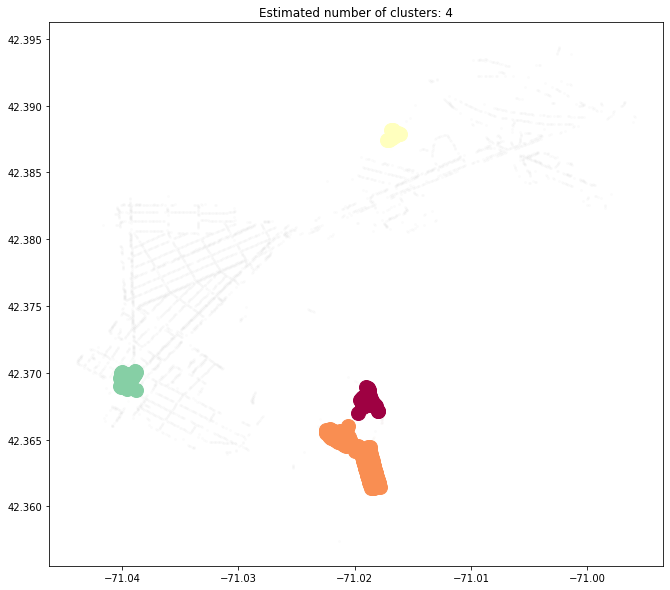

In [212]:
X = east.loc[east['type']=='pickup'][['lon','lat']].to_numpy()
weights = east.loc[east['type']=='pickup']['periodAverageCount'].to_numpy()

db = DBSCAN(eps=0.001, min_samples=2).fit(X, sample_weight=weights)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)


# Plot
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=2, alpha = 0.01)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

#plt.savefig('clusters_pickup.png')

In [213]:
cores = pd.DataFrame(X[core_samples_mask], columns=['lon','lat'])
cores['label'] = labels[core_samples_mask]
cores['density'] = weights[core_samples_mask]
cores.groupby('label').density.sum()

label
0    46.6137
1    88.8332
2     2.0305
3     2.2624
Name: density, dtype: float64

In [214]:
midpoints = pd.DataFrame()
for k in range(cores.label.nunique()):
    midpoints = midpoints.append(cores.iloc[np.sqrt((cores['lat']-cores.groupby('label').lat.mean()[k])**2 \
                   + (cores['lon']-cores.groupby('label').lon.mean()[k])**2)
                .abs().argsort()[:1]])

midpoints

,lon,lat,label,density
216,-71.018968,42.367728,0,12.3333
79,-71.019340,42.363667,1,0.3347
64,-71.016686,42.387746,2,0.0516
136,-71.039433,42.369380,3,0.0443


In [215]:
output = pd.DataFrame(cores.groupby('label').density.sum().reset_index())
output = output.merge(midpoints[['label','lat','lon']], on='label')
output['clusters'] = cores.label.value_counts().sort_index()
output['spread'] = 100*output.density/output.clusters
output['neighborhood'] = 'East Boston'
output.head()

,label,density,lat,lon,clusters,spread,neighborhood
0,0,46.6137,42.367728,-71.018968,64,72.833906,East Boston
1,1,88.8332,42.363667,-71.019340,192,46.267292,East Boston
2,2,2.0305,42.387746,-71.016686,17,11.944118,East Boston
3,3,2.2624,42.369380,-71.039433,51,4.436078,East Boston


In [216]:
total_output = total_output.append(output)
output.to_csv('east_pickup_clusters.csv')

In [217]:
m = folium.Map([42.34, -71.062], tiles = "Stamen Toner", zoom_start=11)
m.add_child(plugins.HeatMap(east.loc[east['type']=='pickup'][['lat','lon','periodAverageCount']], \
                            radius=50, min_opacity=0))

cluster=plugins.MarkerCluster()
lats=cores.lat
lons=cores.lon
labels=cores.label
densities=cores.density
for k in range(len(cores)):
    location = lats[k], lons[k]
    label = labels[k]
    density = densities[k]
    marker = folium.Marker(location=location)
    popup = 'cluster:{}<br>density:{}<br>lon:{}<br>lat:{}'.format(label,density,location[1], location[0])
    folium.Popup(popup).add_to(marker)
    cluster.add_child(marker)

m.add_child(cluster)

locations = output[['lat', 'lon']]
locationlist = locations.values.tolist()
for point in range(len(locationlist)):
    folium.Marker(locationlist[point],icon = folium.Icon(color='red')).add_to(m)
m
#m.save("pudo_clusters_pickup_v1.html")

In [218]:
south = geopandas.sjoin(df,neigh.loc[(neigh.Name=='South Boston')|(neigh.Name=='South Boston Waterfront')], op = 'within')
south = south.to_crs(epsg=4326)
south['lat'] = south.geometry.y
south['lon'] = south.geometry.x
south.head()

,id,periodAverageCount,refId,binPos,type,geometry,index_right,OBJECTID,Name,Acres,Neighborhood_ID,SqMiles,ShapeSTArea,ShapeSTLength,lat,lon
153,34f5f9c9fa4a233dc0e5b708d3261086{9:1,0.0192,34f5f9c9fa4a233dc0e5b708d3261086,1,pickup,POINT (-71.05521 42.33039),23,50,South Boston,1439.888807,17,2.25,6.272131e+07,64998.420283,42.330393,-71.055214
154,34f5f9c9fa4a233dc0e5b708d3261086{9:2,0.0165,34f5f9c9fa4a233dc0e5b708d3261086,2,pickup,POINT (-71.05512 42.33043),23,50,South Boston,1439.888807,17,2.25,6.272131e+07,64998.420283,42.330435,-71.055122
155,34f5f9c9fa4a233dc0e5b708d3261086{9:3,0.0139,34f5f9c9fa4a233dc0e5b708d3261086,3,pickup,POINT (-71.05503 42.33048),23,50,South Boston,1439.888807,17,2.25,6.272131e+07,64998.420283,42.330476,-71.055029
156,34f5f9c9fa4a233dc0e5b708d3261086{9:4,0.0192,34f5f9c9fa4a233dc0e5b708d3261086,4,pickup,POINT (-71.05494 42.33052),23,50,South Boston,1439.888807,17,2.25,6.272131e+07,64998.420283,42.330518,-71.054936
157,34f5f9c9fa4a233dc0e5b708d3261086{9:5,0.0337,34f5f9c9fa4a233dc0e5b708d3261086,5,pickup,POINT (-71.05484 42.33056),23,50,South Boston,1439.888807,17,2.25,6.272131e+07,64998.420283,42.330560,-71.054844


Estimated number of clusters: 14
Estimated number of noise points: 7637


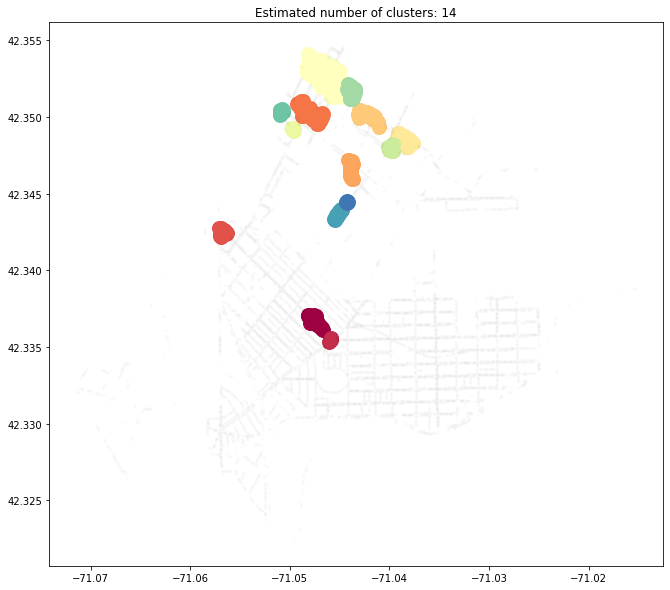

In [219]:
X = south.loc[south['type']=='pickup'][['lon','lat']].to_numpy()
weights = south.loc[south['type']=='pickup']['periodAverageCount'].to_numpy()

db = DBSCAN(eps=0.0005, min_samples=2).fit(X, sample_weight=weights)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)


# Plot
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=2, alpha = 0.01)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

#plt.savefig('clusters_pickup.png')

In [220]:
cores = pd.DataFrame(X[core_samples_mask], columns=['lon','lat'])
cores['label'] = labels[core_samples_mask]
cores['density'] = weights[core_samples_mask]
cores.groupby('label').density.sum()

label
0      5.2752
1      0.3816
2      2.7177
3      7.8508
4      3.9602
5      4.6333
6      5.7006
7     29.8851
8      0.6138
9      1.8585
10     3.7994
11     1.0172
12     3.3670
13     0.4028
Name: density, dtype: float64

In [221]:
midpoints = pd.DataFrame()
for k in range(cores.label.nunique()):
    midpoints = midpoints.append(cores.iloc[np.sqrt((cores['lat']-cores.groupby('label').lat.mean()[k])**2 \
                   + (cores['lon']-cores.groupby('label').lon.mean()[k])**2)
                .abs().argsort()[:1]])

midpoints

,lon,lat,label,density
33,-71.047500,42.336711,0,0.0913
9,-71.045926,42.335395,1,0.1382
38,-71.056780,42.342581,2,0.2692
497,-71.048120,42.350307,3,0.0489
82,-71.043882,42.346614,4,0.0615
443,-71.042244,42.350124,5,0.0509
260,-71.038462,42.348614,6,0.0972
179,-71.046572,42.352463,7,0.0476
124,-71.049710,42.349180,8,0.0899
211,-71.039936,42.347997,9,0.3142


In [222]:
output = pd.DataFrame(cores.groupby('label').density.sum().reset_index())
output = output.merge(midpoints[['label','lat','lon']], on='label')
output['clusters'] = cores.label.value_counts().sort_index()
output['spread'] = 100*output.density/output.clusters
output['neighborhood'] = 'South Boston/Waterfront'
output

,label,density,lat,lon,clusters,spread,neighborhood
0,0,5.2752,42.336711,-71.047500,42,12.560000,South Boston/Waterfront
1,1,0.3816,42.335395,-71.045926,4,9.540000,South Boston/Waterfront
2,2,2.7177,42.342581,-71.056780,23,11.816087,South Boston/Waterfront
3,3,7.8508,42.350307,-71.048120,79,9.937722,South Boston/Waterfront
4,4,3.9602,42.346614,-71.043882,35,11.314857,South Boston/Waterfront
5,5,4.6333,42.350124,-71.042244,38,12.192895,South Boston/Waterfront
6,6,5.7006,42.348614,-71.038462,36,15.835000,South Boston/Waterfront
7,7,29.8851,42.352463,-71.046572,186,16.067258,South Boston/Waterfront
8,8,0.6138,42.349180,-71.049710,6,10.230000,South Boston/Waterfront
9,9,1.8585,42.347997,-71.039936,15,12.390000,South Boston/Waterfront


In [223]:
total_output = total_output.append(output)
output.to_csv('south_pickup_clusters.csv')

In [224]:
m = folium.Map([42.34, -71.062], tiles = "Stamen Toner", zoom_start=11)
m.add_child(plugins.HeatMap(south.loc[south['type']=='pickup'][['lat','lon','periodAverageCount']], \
                            radius=50, min_opacity=0))

cluster=plugins.MarkerCluster()
lats=cores.lat
lons=cores.lon
labels=cores.label
densities=cores.density
for k in range(len(cores)):
    location = lats[k], lons[k]
    label = labels[k]
    density = densities[k]
    marker = folium.Marker(location=location)
    popup = 'cluster:{}<br>density:{}<br>lon:{}<br>lat:{}'.format(label,density,location[1], location[0])
    folium.Popup(popup).add_to(marker)
    cluster.add_child(marker)

m.add_child(cluster)

locations = output[['lat', 'lon']]
locationlist = locations.values.tolist()
for point in range(len(locationlist)):
    folium.Marker(locationlist[point],icon = folium.Icon(color='red')).add_to(m)
m
#m.save("pudo_clusters_pickup_v1.html")

In [225]:
ros = geopandas.sjoin(df,neigh.loc[neigh.Name.isin(['Roslindale','West Roxbury','Hyde Park','Mattapan'])],
                      op = 'within')
ros = ros.to_crs(epsg=4326)
ros['lat'] = ros.geometry.y
ros['lon'] = ros.geometry.x
ros.head()

,id,periodAverageCount,refId,binPos,type,geometry,index_right,OBJECTID,Name,Acres,Neighborhood_ID,SqMiles,ShapeSTArea,ShapeSTLength,lat,lon
68930,635d1f83b767c98fa8a6e618b49c605b{8:6,0.0066,635d1f83b767c98fa8a6e618b49c605b,6,dropoff,POINT (-71.10021 42.27375),20,47,Mattapan,1352.098354,12,2.11,5.889717e+07,42005.773707,42.273748,-71.100208
68943,86e6c214b588f2c3ee74b1d815c19a31{17:1,0.0119,86e6c214b588f2c3ee74b1d815c19a31,1,dropoff,POINT (-71.07641 42.27827),20,47,Mattapan,1352.098354,12,2.11,5.889717e+07,42005.773707,42.278272,-71.076413
68944,86e6c214b588f2c3ee74b1d815c19a31{17:3,0.0046,86e6c214b588f2c3ee74b1d815c19a31,3,dropoff,POINT (-71.07645 42.27810),20,47,Mattapan,1352.098354,12,2.11,5.889717e+07,42005.773707,42.278097,-71.076447
68945,86e6c214b588f2c3ee74b1d815c19a31{17:4,0.0179,86e6c214b588f2c3ee74b1d815c19a31,4,dropoff,POINT (-71.07646 42.27801),20,47,Mattapan,1352.098354,12,2.11,5.889717e+07,42005.773707,42.278010,-71.076464
68946,86e6c214b588f2c3ee74b1d815c19a31{17:11,0.0073,86e6c214b588f2c3ee74b1d815c19a31,11,dropoff,POINT (-71.07702 42.27764),20,47,Mattapan,1352.098354,12,2.11,5.889717e+07,42005.773707,42.277644,-71.077020


Estimated number of clusters: 4
Estimated number of noise points: 4358


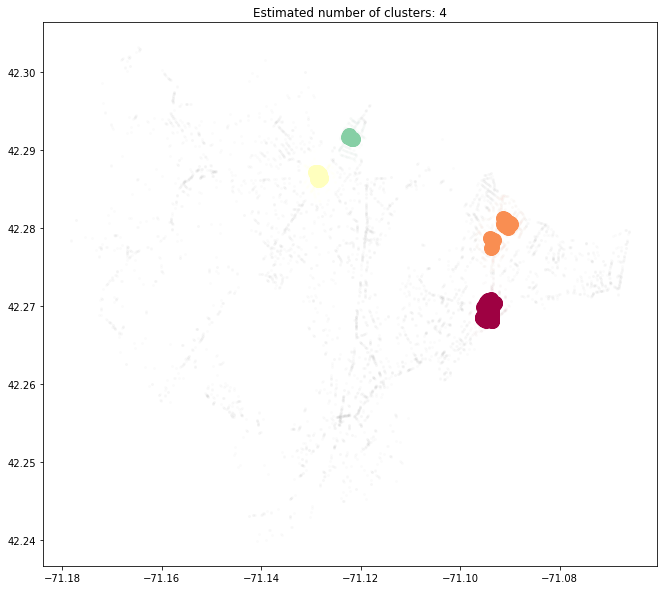

In [226]:
X = ros.loc[ros['type']=='pickup'][['lon','lat']].to_numpy()
weights = ros.loc[ros['type']=='pickup']['periodAverageCount'].to_numpy()

db = DBSCAN(eps=0.003, min_samples=2).fit(X, sample_weight=weights)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)


# Plot
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=2, alpha = 0.01)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

#plt.savefig('clusters_pickup.png')

In [227]:
cores = pd.DataFrame(X[core_samples_mask], columns=['lon','lat'])
cores['label'] = labels[core_samples_mask]
cores['density'] = weights[core_samples_mask]
cores.groupby('label').density.sum()

label
0    1.1642
1    0.1831
2    0.2165
3    0.0528
Name: density, dtype: float64

In [228]:
midpoints = pd.DataFrame()
for k in range(cores.label.nunique()):
    midpoints = midpoints.append(cores.iloc[np.sqrt((cores['lat']-cores.groupby('label').lat.mean()[k])**2 \
                   + (cores['lon']-cores.groupby('label').lon.mean()[k])**2)
                .abs().argsort()[:1]])

midpoints

,lon,lat,label,density
38,-71.093839,42.269186,0,0.0152
13,-71.091352,42.280440,1,0.0086
109,-71.128821,42.286704,2,0.0060
120,-71.121979,42.291474,3,0.0053


In [229]:
output = pd.DataFrame(cores.groupby('label').density.sum().reset_index())
output = output.merge(midpoints[['label','lat','lon']], on='label')
output['clusters'] = cores.label.value_counts().sort_index()
output['spread'] = 100*output.density/output.clusters
output['neighborhood'] = 'Roslindale/Mattapan/Hyde Park/West Roxbury'
output

,label,density,lat,lon,clusters,spread,neighborhood
0,0,1.1642,42.269186,-71.093839,77,1.511948,Roslindale/Mattapan/Hyde Park/West Roxbury
1,1,0.1831,42.280440,-71.091352,22,0.832273,Roslindale/Mattapan/Hyde Park/West Roxbury
2,2,0.2165,42.286704,-71.128821,22,0.984091,Roslindale/Mattapan/Hyde Park/West Roxbury
3,3,0.0528,42.291474,-71.121979,9,0.586667,Roslindale/Mattapan/Hyde Park/West Roxbury


In [230]:
total_output = total_output.append(output)
output.to_csv('rosmathydewrox_pickup_clusters.csv')

In [231]:
m = folium.Map([42.34, -71.062], tiles = "Stamen Toner", zoom_start=11)
m.add_child(plugins.HeatMap(ros.loc[ros['type']=='pickup'][['lat','lon','periodAverageCount']], \
                            radius=50, min_opacity=0))

cluster=plugins.MarkerCluster()
lats=cores.lat
lons=cores.lon
labels=cores.label
densities=cores.density
for k in range(len(cores)):
    location = lats[k], lons[k]
    label = labels[k]
    density = densities[k]
    marker = folium.Marker(location=location)
    popup = 'cluster:{}<br>density:{}<br>lon:{}<br>lat:{}'.format(label,density,location[1], location[0])
    folium.Popup(popup).add_to(marker)
    cluster.add_child(marker)

m.add_child(cluster)

locations = output[['lat', 'lon']]
locationlist = locations.values.tolist()
for point in range(len(locationlist)):
    folium.Marker(locationlist[point],icon = folium.Icon(color='red')).add_to(m)
m
#m.save("pudo_clusters_pickup_v1.html")

In [232]:
charles = geopandas.sjoin(df,neigh.loc[neigh.Name=='Charlestown'],
                      op = 'within')
charles = charles.to_crs(epsg=4326)
charles['lat'] = charles.geometry.y
charles['lon'] = charles.geometry.x
charles.head()

,id,periodAverageCount,refId,binPos,type,geometry,index_right,OBJECTID,Name,Acres,Neighborhood_ID,SqMiles,ShapeSTArea,ShapeSTLength,lat,lon
174174,a8b6c595d13714232994dea0bb432218{25:10,0.0040,a8b6c595d13714232994dea0bb432218,10,pickup,POINT (-71.06896 42.37576),12,39,Charlestown,871.541223,4,1.36,3.796418e+07,57509.688645,42.375762,-71.068962
174175,a8b6c595d13714232994dea0bb432218{25:11,0.0086,a8b6c595d13714232994dea0bb432218,11,pickup,POINT (-71.06891 42.37568),12,39,Charlestown,871.541223,4,1.36,3.796418e+07,57509.688645,42.375681,-71.068914
174176,a8b6c595d13714232994dea0bb432218{25:12,0.0040,a8b6c595d13714232994dea0bb432218,12,pickup,POINT (-71.06887 42.37560),12,39,Charlestown,871.541223,4,1.36,3.796418e+07,57509.688645,42.375599,-71.068867
174177,a8b6c595d13714232994dea0bb432218{25:5,0.0040,a8b6c595d13714232994dea0bb432218,5,dropoff,POINT (-71.06922 42.37616),12,39,Charlestown,871.541223,4,1.36,3.796418e+07,57509.688645,42.376158,-71.069216
174178,a8b6c595d13714232994dea0bb432218{25:7,0.0066,a8b6c595d13714232994dea0bb432218,7,dropoff,POINT (-71.06913 42.37599),12,39,Charlestown,871.541223,4,1.36,3.796418e+07,57509.688645,42.375991,-71.069132


Estimated number of clusters: 4
Estimated number of noise points: 2339


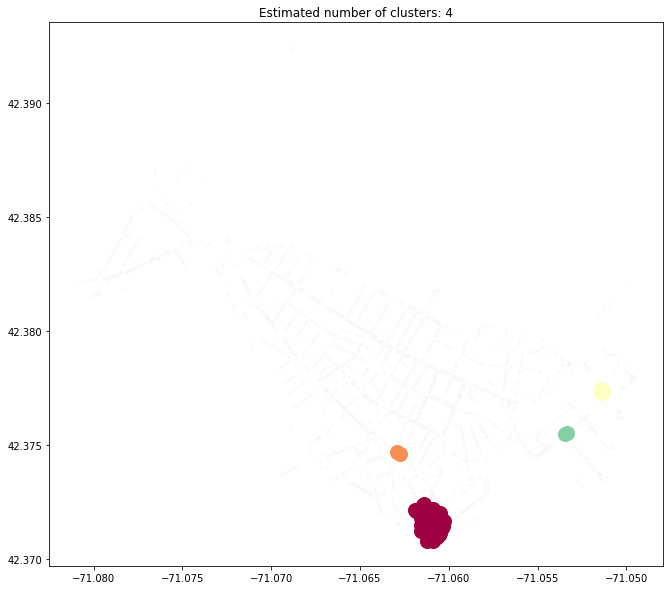

In [233]:
X = charles.loc[charles['type']=='pickup'][['lon','lat']].to_numpy()
weights = charles.loc[charles['type']=='pickup']['periodAverageCount'].to_numpy()

db = DBSCAN(eps=0.001, min_samples=2).fit(X, sample_weight=weights)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)


# Plot
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=2, alpha = 0.01)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

#plt.savefig('clusters_pickup.png')

In [234]:
cores = pd.DataFrame(X[core_samples_mask], columns=['lon','lat'])
cores['label'] = labels[core_samples_mask]
cores['density'] = weights[core_samples_mask]
cores.groupby('label').density.sum()

label
0    2.3957
1    0.0252
2    0.0661
3    0.0721
Name: density, dtype: float64

In [235]:
midpoints = pd.DataFrame()
for k in range(cores.label.nunique()):
    midpoints = midpoints.append(cores.iloc[np.sqrt((cores['lat']-cores.groupby('label').lat.mean()[k])**2 \
                   + (cores['lon']-cores.groupby('label').lon.mean()[k])**2)
                .abs().argsort()[:1]])

midpoints

,lon,lat,label,density
49,-71.061030,42.371649,0,0.0225
43,-71.062727,42.374617,1,0.0126
58,-71.051420,42.377335,2,0.0198
75,-71.053459,42.375453,3,0.0503


In [236]:
output = pd.DataFrame(cores.groupby('label').density.sum().reset_index())
output = output.merge(midpoints[['label','lat','lon']], on='label')
output['clusters'] = cores.label.value_counts().sort_index()
output['spread'] = 100*output.density/output.clusters
output['neighborhood'] = 'Charlestown'
output

,label,density,lat,lon,clusters,spread,neighborhood
0,0,2.3957,42.371649,-71.061030,69,3.472029,Charlestown
1,1,0.0252,42.374617,-71.062727,2,1.260000,Charlestown
2,2,0.0661,42.377335,-71.051420,4,1.652500,Charlestown
3,3,0.0721,42.375453,-71.053459,2,3.605000,Charlestown


In [237]:
total_output = total_output.append(output)
output.to_csv('charles_pickup_clusters.csv')

In [238]:
m = folium.Map([42.34, -71.062], tiles = "Stamen Toner", zoom_start=11)
m.add_child(plugins.HeatMap(charles.loc[charles['type']=='pickup'][['lat','lon','periodAverageCount']], \
                            radius=50, min_opacity=0))

cluster=plugins.MarkerCluster()
lats=cores.lat
lons=cores.lon
labels=cores.label
densities=cores.density
for k in range(len(cores)):
    location = lats[k], lons[k]
    label = labels[k]
    density = densities[k]
    marker = folium.Marker(location=location)
    popup = 'cluster:{}<br>density:{}<br>lon:{}<br>lat:{}'.format(label,density,location[1], location[0])
    folium.Popup(popup).add_to(marker)
    cluster.add_child(marker)

m.add_child(cluster)

locations = output[['lat', 'lon']]
locationlist = locations.values.tolist()
for point in range(len(locationlist)):
    folium.Marker(locationlist[point],icon = folium.Icon(color='red')).add_to(m)
m
#m.save("pudo_clusters_pickup_v1.html")

In [251]:
central = geopandas.sjoin(df,neigh.loc[neigh.Name.isin(['Mission Hill','Longwood','South End','Back Bay','Fenway'])],
                      op = 'within')
central = central.to_crs(epsg=4326)
central['lat'] = central.geometry.y
central['lon'] = central.geometry.x
central.head()

,id,periodAverageCount,refId,binPos,type,geometry,index_right,OBJECTID,Name,Acres,Neighborhood_ID,SqMiles,ShapeSTArea,ShapeSTLength,lat,lon
52,d69c098c2929c1ce95989aeab0a7fee9{10:1,0.0165,d69c098c2929c1ce95989aeab0a7fee9,1,pickup,POINT (-71.07876 42.34787),10,37,Back Bay,399.314411,2,0.62,1.739407e+07,19455.671146,42.347866,-71.078755
53,d69c098c2929c1ce95989aeab0a7fee9{10:2,0.0106,d69c098c2929c1ce95989aeab0a7fee9,2,pickup,POINT (-71.07884 42.34781),10,37,Back Bay,399.314411,2,0.62,1.739407e+07,19455.671146,42.347809,-71.078841
54,d69c098c2929c1ce95989aeab0a7fee9{10:3,0.0119,d69c098c2929c1ce95989aeab0a7fee9,3,pickup,POINT (-71.07892 42.34775),10,37,Back Bay,399.314411,2,0.62,1.739407e+07,19455.671146,42.347748,-71.078921
55,d69c098c2929c1ce95989aeab0a7fee9{10:4,0.0218,d69c098c2929c1ce95989aeab0a7fee9,4,pickup,POINT (-71.07900 42.34768),10,37,Back Bay,399.314411,2,0.62,1.739407e+07,19455.671146,42.347685,-71.078999
56,d69c098c2929c1ce95989aeab0a7fee9{10:5,0.0218,d69c098c2929c1ce95989aeab0a7fee9,5,pickup,POINT (-71.07908 42.34762),10,37,Back Bay,399.314411,2,0.62,1.739407e+07,19455.671146,42.347622,-71.079077


Estimated number of clusters: 17
Estimated number of noise points: 11952


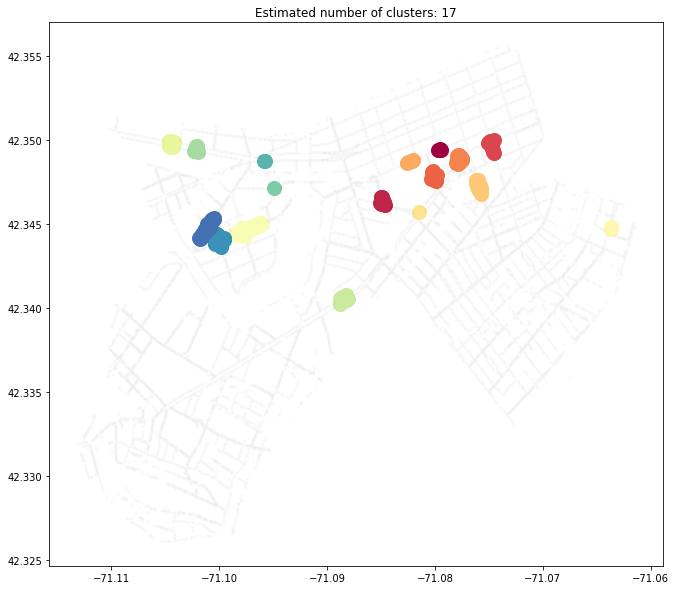

In [256]:
X = central.loc[central['type']=='pickup'][['lon','lat']].to_numpy()
weights = central.loc[central['type']=='pickup']['periodAverageCount'].to_numpy()

db = DBSCAN(eps=0.0005, min_samples=4).fit(X, sample_weight=weights)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)


# Plot
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=2, alpha = 0.01)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

#plt.savefig('clusters_pickup.png')

In [257]:
cores = pd.DataFrame(X[core_samples_mask], columns=['lon','lat'])
cores['label'] = labels[core_samples_mask]
cores['density'] = weights[core_samples_mask]
cores.groupby('label').density.sum()

label
0      0.9345
1      3.1396
2      5.0548
3      4.1436
4      3.9279
5      3.7686
6      7.1638
7      0.1991
8      0.4206
9     12.2666
10     2.9577
11     4.7989
12     3.0330
13     0.5298
14     0.4418
15     7.8475
16     8.1804
Name: density, dtype: float64

In [258]:
midpoints = pd.DataFrame()
for k in range(cores.label.nunique()):
    midpoints = midpoints.append(cores.iloc[np.sqrt((cores['lat']-cores.groupby('label').lat.mean()[k])**2 \
                   + (cores['lon']-cores.groupby('label').lon.mean()[k])**2)
                .abs().argsort()[:1]])

midpoints

,lon,lat,label,density
1,-71.079637,42.349424,0,0.3069
58,-71.084891,42.346380,1,0.1984
23,-71.074748,42.349632,2,0.8889
9,-71.080051,42.347797,3,0.3452
77,-71.077774,42.348824,4,0.0516
42,-71.082254,42.348715,5,0.7480
67,-71.076022,42.347184,6,0.6475
89,-71.081479,42.345733,7,0.1991
99,-71.063713,42.344719,8,0.2189
123,-71.097297,42.344653,9,0.7063


In [261]:
output = pd.DataFrame(cores.groupby('label').density.sum().reset_index())
output = output.merge(midpoints[['label','lat','lon']], on='label')
output['clusters'] = cores.label.value_counts().sort_index()
output['spread'] = 100*output.density/output.clusters
output['neighborhood'] = 'Back Bay/Fenway/Mission Hill/Longwood/South End'
output

,label,density,lat,lon,clusters,spread,neighborhood
0,0,0.9345,42.349424,-71.079637,4,23.362500,Back Bay/Fenway/Mission Hill/Longwood/South End
1,1,3.1396,42.346380,-71.084891,16,19.622500,Back Bay/Fenway/Mission Hill/Longwood/South End
2,2,5.0548,42.349632,-71.074748,14,36.105714,Back Bay/Fenway/Mission Hill/Longwood/South End
3,3,4.1436,42.347797,-71.080051,24,17.265000,Back Bay/Fenway/Mission Hill/Longwood/South End
4,4,3.9279,42.348824,-71.077774,20,19.639500,Back Bay/Fenway/Mission Hill/Longwood/South End
5,5,3.7686,42.348715,-71.082254,6,62.810000,Back Bay/Fenway/Mission Hill/Longwood/South End
6,6,7.1638,42.347184,-71.076022,21,34.113333,Back Bay/Fenway/Mission Hill/Longwood/South End
7,7,0.1991,42.345733,-71.081479,1,19.910000,Back Bay/Fenway/Mission Hill/Longwood/South End
8,8,0.4206,42.344719,-71.063713,2,21.030000,Back Bay/Fenway/Mission Hill/Longwood/South End
9,9,12.2666,42.344653,-71.097297,52,23.589615,Back Bay/Fenway/Mission Hill/Longwood/South End


In [262]:
total_output = total_output.append(output)
output.to_csv('bbfenmhlongse_pickup_clusters.csv')

In [260]:
m = folium.Map([42.34, -71.062], tiles = "Stamen Toner", zoom_start=11)
m.add_child(plugins.HeatMap(central.loc[central['type']=='pickup'][['lat','lon','periodAverageCount']], \
                            radius=50, min_opacity=0))

cluster=plugins.MarkerCluster()
lats=cores.lat
lons=cores.lon
labels=cores.label
densities=cores.density
for k in range(len(cores)):
    location = lats[k], lons[k]
    label = labels[k]
    density = densities[k]
    marker = folium.Marker(location=location)
    popup = 'cluster:{}<br>density:{}<br>lon:{}<br>lat:{}'.format(label,density,location[1], location[0])
    folium.Popup(popup).add_to(marker)
    cluster.add_child(marker)

m.add_child(cluster)

locations = output[['lat', 'lon']]
locationlist = locations.values.tolist()
for point in range(len(locationlist)):
    folium.Marker(locationlist[point],icon = folium.Icon(color='red')).add_to(m)
m
#m.save("pudo_clusters_pickup_v1.html")

In [263]:
downtown = geopandas.sjoin(df,neigh.loc[neigh.Name.isin(['Bay Village','Leather District','Chinatown', \
                                                         'North End','West End','Beacon Hill','Downtown'])],
                      op = 'within')
downtown = downtown.to_crs(epsg=4326)
downtown['lat'] = downtown.geometry.y
downtown['lon'] = downtown.geometry.x
downtown.head()

,id,periodAverageCount,refId,binPos,type,geometry,index_right,OBJECTID,Name,Acres,Neighborhood_ID,SqMiles,ShapeSTArea,ShapeSTLength,lat,lon
0,a0d53a79cf6ea00f13414a47bf629923{7:1,0.0450,a0d53a79cf6ea00f13414a47bf629923,1,pickup,POINT (-71.06937 42.35025),4,31,Bay Village,26.539839,33,0.04,1.156071e+06,4650.635493,42.350251,-71.069365
1,a0d53a79cf6ea00f13414a47bf629923{7:2,0.0225,a0d53a79cf6ea00f13414a47bf629923,2,pickup,POINT (-71.06925 42.35028),4,31,Bay Village,26.539839,33,0.04,1.156071e+06,4650.635493,42.350282,-71.069255
2,a0d53a79cf6ea00f13414a47bf629923{7:3,0.0205,a0d53a79cf6ea00f13414a47bf629923,3,pickup,POINT (-71.06914 42.35031),4,31,Bay Village,26.539839,33,0.04,1.156071e+06,4650.635493,42.350313,-71.069144
3,a0d53a79cf6ea00f13414a47bf629923{7:4,0.0218,a0d53a79cf6ea00f13414a47bf629923,4,pickup,POINT (-71.06903 42.35034),4,31,Bay Village,26.539839,33,0.04,1.156071e+06,4650.635493,42.350344,-71.069034
4,a0d53a79cf6ea00f13414a47bf629923{7:5,0.0437,a0d53a79cf6ea00f13414a47bf629923,5,pickup,POINT (-71.06892 42.35037),4,31,Bay Village,26.539839,33,0.04,1.156071e+06,4650.635493,42.350375,-71.068923


Estimated number of clusters: 24
Estimated number of noise points: 6034


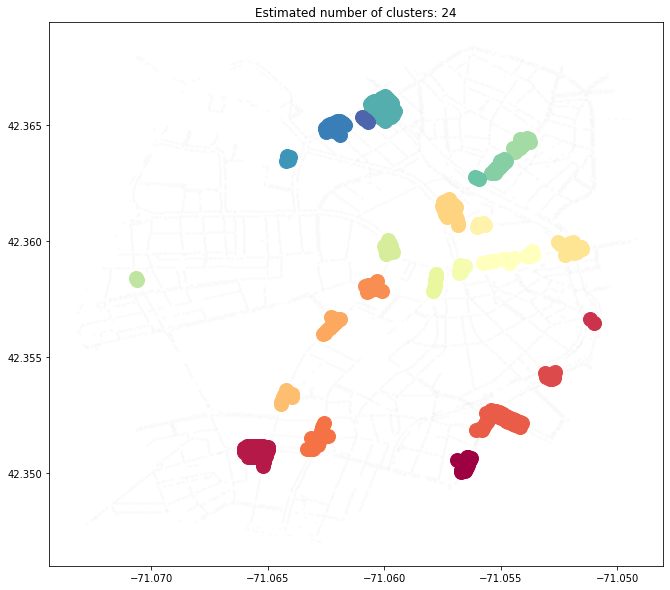

In [265]:
X = downtown.loc[downtown['type']=='pickup'][['lon','lat']].to_numpy()
weights = downtown.loc[downtown['type']=='pickup']['periodAverageCount'].to_numpy()

db = DBSCAN(eps=0.0005, min_samples=3).fit(X, sample_weight=weights)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)


# Plot
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', color=tuple(col),
             markersize=2, alpha = 0.01)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

#plt.savefig('clusters_pickup.png')

In [266]:
cores = pd.DataFrame(X[core_samples_mask], columns=['lon','lat'])
cores['label'] = labels[core_samples_mask]
cores['density'] = weights[core_samples_mask]
cores.groupby('label').density.sum()

label
0     3.9966
1     5.9373
2     0.0192
3     0.8908
4     8.8802
5     4.4789
6     3.1238
7     3.8348
8     2.5595
9     4.2753
10    1.6654
11    1.1977
12    3.3293
13    0.7990
14    3.6231
15    2.6622
16    0.6786
17    2.9960
18    3.1415
19    0.0430
20    7.4932
21    0.1588
22    3.1423
23    1.2910
Name: density, dtype: float64

In [267]:
midpoints = pd.DataFrame()
for k in range(cores.label.nunique()):
    midpoints = midpoints.append(cores.iloc[np.sqrt((cores['lat']-cores.groupby('label').lat.mean()[k])**2 \
                   + (cores['lon']-cores.groupby('label').lon.mean()[k])**2)
                .abs().argsort()[:1]])

midpoints

,lon,lat,label,density
63,-71.056549,42.350367,0,0.4702
22,-71.065429,42.351059,1,0.4193
111,-71.050969,42.356456,2,0.0040
8,-71.052871,42.354225,3,0.0258
75,-71.055075,42.352398,4,0.2837
283,-71.062774,42.351507,5,0.0165
68,-71.060526,42.357991,6,0.1733
257,-71.062197,42.356380,7,0.6925
104,-71.064192,42.353337,8,0.0516
167,-71.057108,42.361429,9,0.4319


In [269]:
output = pd.DataFrame(cores.groupby('label').density.sum().reset_index())
output = output.merge(midpoints[['label','lat','lon']], on='label')
output['clusters'] = cores.label.value_counts().sort_index()
output['spread'] = 100*output.density/output.clusters
output['neighborhood'] = 'Downtown/North End/West End/Chinatown/Beacon Hill'
output

,label,density,lat,lon,clusters,spread,neighborhood
0,0,3.9966,42.350367,-71.056549,27,14.802222,Downtown/North End/West End/Chinatown/Beacon Hill
1,1,5.9373,42.351059,-71.065429,34,17.462647,Downtown/North End/West End/Chinatown/Beacon Hill
2,2,0.0192,42.356456,-71.050969,2,0.960000,Downtown/North End/West End/Chinatown/Beacon Hill
3,3,0.8908,42.354225,-71.052871,12,7.423333,Downtown/North End/West End/Chinatown/Beacon Hill
4,4,8.8802,42.352398,-71.055075,49,18.122857,Downtown/North End/West End/Chinatown/Beacon Hill
5,5,4.4789,42.351507,-71.062774,19,23.573158,Downtown/North End/West End/Chinatown/Beacon Hill
6,6,3.1238,42.357991,-71.060526,17,18.375294,Downtown/North End/West End/Chinatown/Beacon Hill
7,7,3.8348,42.356380,-71.062197,15,25.565333,Downtown/North End/West End/Chinatown/Beacon Hill
8,8,2.5595,42.353337,-71.064192,12,21.329167,Downtown/North End/West End/Chinatown/Beacon Hill
9,9,4.2753,42.361429,-71.057108,29,14.742414,Downtown/North End/West End/Chinatown/Beacon Hill


In [272]:
total_output = total_output.append(output)
output.to_csv('downtown_pickup_clusters.csv')

In [271]:
m = folium.Map([42.34, -71.062], tiles = "Stamen Toner", zoom_start=11)
m.add_child(plugins.HeatMap(downtown.loc[downtown['type']=='pickup'][['lat','lon','periodAverageCount']], \
                            radius=50, min_opacity=0))

cluster=plugins.MarkerCluster()
lats=cores.lat
lons=cores.lon
labels=cores.label
densities=cores.density
for k in range(len(cores)):
    location = lats[k], lons[k]
    label = labels[k]
    density = densities[k]
    marker = folium.Marker(location=location)
    popup = 'cluster:{}<br>density:{}<br>lon:{}<br>lat:{}'.format(label,density,location[1], location[0])
    folium.Popup(popup).add_to(marker)
    cluster.add_child(marker)

m.add_child(cluster)

locations = output[['lat', 'lon']]
locationlist = locations.values.tolist()
for point in range(len(locationlist)):
    folium.Marker(locationlist[point],icon = folium.Icon(color='red')).add_to(m)
m
#m.save("pudo_clusters_pickup_v1.html")

In [107]:
neigh.Name.unique()

array(['Roslindale', 'Jamaica Plain', 'Mission Hill', 'Longwood',
       'Bay Village', 'Leather District', 'Chinatown', 'North End',
       'Roxbury', 'South End', 'Back Bay', 'East Boston', 'Charlestown',
       'West End', 'Beacon Hill', 'Downtown', 'Fenway', 'Brighton',
       'West Roxbury', 'Hyde Park', 'Mattapan', 'Dorchester',
       'South Boston Waterfront', 'South Boston', 'Allston',
       'Harbor Islands'], dtype=object)

In [280]:
total_output.sort_values(by='spread', ascending=False).reset_index(drop=True).head(20)

,label,density,lat,lon,clusters,spread,neighborhood
0,0,46.6137,42.367728,-71.018968,64,72.833906,East Boston
1,5,3.7686,42.348715,-71.082254,6,62.810000,Back Bay/Fenway/Mission Hill/Longwood/South End
2,13,0.5298,42.347132,-71.094954,1,52.980000,Back Bay/Fenway/Mission Hill/Longwood/South End
3,12,3.0330,42.349319,-71.102075,6,50.550000,Back Bay/Fenway/Mission Hill/Longwood/South End
4,1,88.8332,42.363667,-71.019340,192,46.267292,East Boston
5,14,3.6231,42.358236,-71.057802,10,36.231000,Downtown/North End/West End/Chinatown/Beacon Hill
6,2,5.0548,42.349632,-71.074748,14,36.105714,Back Bay/Fenway/Mission Hill/Longwood/South End
7,11,4.7989,42.340436,-71.088384,14,34.277857,Back Bay/Fenway/Mission Hill/Longwood/South End
8,6,7.1638,42.347184,-71.076022,21,34.113333,Back Bay/Fenway/Mission Hill/Longwood/South End
9,16,0.6786,42.358391,-71.070665,2,33.930000,Downtown/North End/West End/Chinatown/Beacon Hill


In [282]:
total_output = total_output.reset_index(drop=True)
total_output.to_csv("total_pickup_clusters.csv")

# Other data sources

In [38]:
cluster_df = pd.read_csv("cluster_test_v1.csv")
ped = pd.read_csv("PUDO_ped_crashes.csv")
mv = pd.read_csv("PUDO_mv_crashes.csv")
bike = pd.read_csv("PUDO_bike_crashes.csv")

cluster_df = cluster_df.merge(ped, on="id")
cluster_df = cluster_df.merge(mv, on="id")
cluster_df = cluster_df.merge(bike, on="id")
cluster_df.head()

,id,Dropoff ID,Pickup ID,Location,Neighborhood,Lat,Lon,Core Clusters Dropoff,Core Clusters Pickup,Density Dropoff,Density Pickup,Notes,ped_crash_total,mv_crash_total,bike_crash_total
0,1,23.0,24.0,Logan Airport Terminal A,Airport,42.364715,-71.021233,23,24.0,76.8,51.8,Already addressed with PUDO zone @ airport,7,46,0
1,2,22.0,25.0,Logan Airport Terminal C,Airport,42.366236,-71.017404,38,49.0,83.2,46.4,Already addressed with PUDO zone @ airport,9,31,0
2,3,28.0,27.0,Logan Airport Terminal B (1),Airport,42.362687,-71.019063,40,28.0,70.5,21.6,Already addressed with PUDO zone @ airport,3,17,0
3,4,NaN,3.0,Intersection of Boylston St. and Fenway Dr.,Back Bay,42.344472,-71.097967,0,52.0,0.0,12.3,"Fenway, near pickup cluster 19",37,41,13
4,5,25.0,28.0,Logan AIrport Terminal B (2),Airport,42.362225,-71.018049,46,24.0,35.9,10.3,Already addressed with PUDO zone @ airport,3,17,0


In [40]:
cluster_df.sort_values(by='mv_crash_total', ascending=False)

,id,Dropoff ID,Pickup ID,Location,Neighborhood,Lat,Lon,Core Clusters Dropoff,Core Clusters Pickup,Density Dropoff,Density Pickup,Notes,ped_crash_total,mv_crash_total,bike_crash_total
8,9,26.0,23.0,Causway St. @TD Garden/North Station,Downtown,42.365784,-71.060253,7,48.0,1.3,7.0,NaN,26,196,23
26,27,NaN,26.0,Union St. @ Holocaust Memorial,Downtown,42.361347,-71.057063,0,2.0,0.0,0.4,NaN,62,194,35
27,28,NaN,1.0,Intersection of Harrison Ave. and Traveler St.,Downtown,42.344720,-71.063713,0,2.0,0.0,0.4,NaN,34,165,18
37,38,29.0,NaN,Red Auerbach Way @TD Garden/North Station,Downtown,42.365800,-71.063663,12,NaN,3.9,NaN,NaN,12,139,8
21,22,4.0,4.0,Intersection of Atlantic Ave. and Beach St. @S...,Downtown,42.350432,-71.056503,40,15.0,35.6,2.9,NaN,37,124,14
16,17,10.0,18.0,Intersection of Atlantic Ave. and Summer St. @...,Downtown,42.352446,-71.055297,36,19.0,20.7,3.7,NaN,35,107,19
40,41,17.0,NaN,528 Commonwealth Ave. @Kenmore Sq.,Back Bay,42.348701,-71.095727,2,NaN,0.9,NaN,NaN,16,103,27
28,29,NaN,17.0,Intersection of Commonwealth Ave. and Beacon St.,Back Bay,42.348743,-71.095839,0,2.0,0.0,0.4,NaN,16,102,27
11,12,7.0,6.0,Intersection of Saint James Ave. and Clarendon...,Back Bay,42.349778,-71.074869,3,14.0,4.5,5.1,NaN,72,97,22
23,24,NaN,2.0,Intersection of Boylston St. and Exeter St.,Back Bay,42.349367,-71.079475,0,4.0,0.0,0.9,Prudential Center,62,91,25
